In [ ]:
%%shell
jupyter nbconvert --to html /content/fisrt3.ipynb

[NbConvertApp] Converting notebook /content/fisrt3.ipynb to html
/usr/local/lib/python2.7/dist-packages/nbconvert/filters/datatypefilter.py:41: UserWarning: Your element with mimetype(s) [u'application/vnd.plotly.v1+json'] is not able to be represented.
  mimetypes=output.keys())
[NbConvertApp] Writing 25550320 bytes to /content/fisrt3.html


In [ ]:
import torch
import torchvision
from bs4 import BeautifulSoup

import PIL
from torchvision import transforms, datasets, models
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor
from engine import train_one_epoch, evaluate
import matplotlib.pyplot as plt
import numpy as np
import torchvision.transforms.functional as F
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import torch
import torch.utils.data
import torchvision
from PIL import Image
from pycocotools.coco import COCO
import matplotlib.patches as patches
import cv2
import pandas as pd
import numpy as np
import os
import glob
import xml.etree.ElementTree as ET 
import torch.nn as nn
import torchmetrics.detection.map as MAP
import wandb
import torchvision.transforms as T
from transforms import Compose, RandomHorizontalFlip, ToTensor, RandomZoomOut
import plotly.graph_objects as go


In [ ]:
!wandb login

wandb: Currently logged in as: eldadron (use `wandb login --relogin` to force relogin)


In [ ]:
config ={
  'architecture': 'fasterrcnn_resnet50_fpn',
  'epochs': 20,
  'batch size': 4,
  'learning rate': 0.008,
  'num workers': 4,
  'device': 'cuda:0',
  'optimizer': 'SGD',
  'loss': 'focal loss',
  'run name': 'model_SGD_0.008_4_aug_focal',
  'num classes': 4,
  'model name': 'model_SGD_0.008_4_aug_focal.pth',
  'load mode' : False,
  'load path' : None
} 
# run_name = 'runs/adamw_lr_0.0001_CE_loss_aug_bs_8'
# wandb.init(project="mask_detection", config=config)
wan = wandb.init(project="mask_detection", entity="eldadron", config=config)

wandb: Currently logged in as: eldadron (use `wandb login --relogin` to force relogin)
wandb: wandb version 0.12.7 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


first we start with some data explaratory, lest have a look on the class distribution in each dataset (all images, and train val split)

In [ ]:
train_csv = pd.read_csv("/home/linuxgpu/ex1/DATA/csv/train/_annotations.csv")
valid_csv = pd.read_csv("/home/linuxgpu/ex1/DATA/csv/valid/_annotations.csv")
all_train_csv = pd.read_csv("/home/linuxgpu/ex1/DATA/csv/all_train/_annotations.csv")

In [ ]:
all_train_csv.groupby('class').size()

class
mask_weared_incorrect     121
with_mask                3184
without_mask              716
dtype: int64

<AxesSubplot:xlabel='class'>

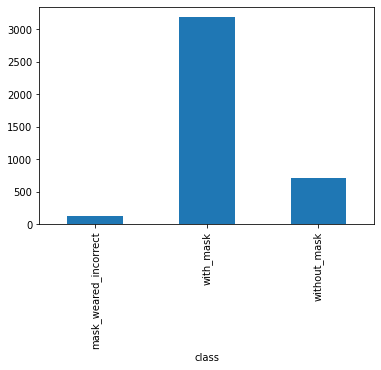

In [ ]:
all_train_csv.groupby('class').size().plot(kind='bar')

In [ ]:
source = all_train_csv['class'].value_counts()
fig = go.Figure(data=[go.Pie(labels=source.index,values=source.values)])
fig.update_layout(title='class distribution all images')
# wandb.log({"class distribution all images": fig})
fig.show()

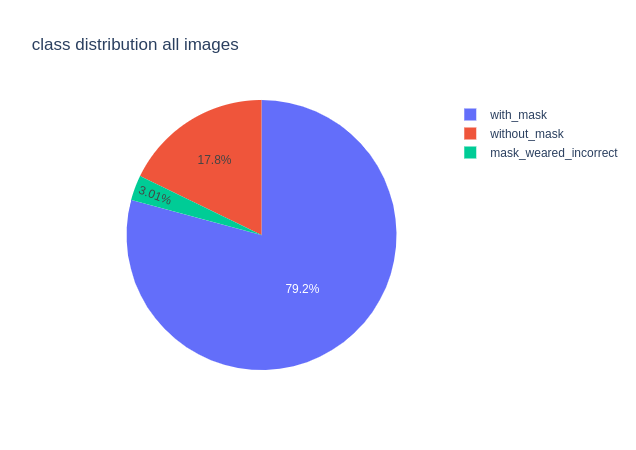

In [ ]:
train_csv.groupby('class').size()

class
mask_weared_incorrect      98
with_mask                2579
without_mask              615
dtype: int64

<AxesSubplot:xlabel='class'>

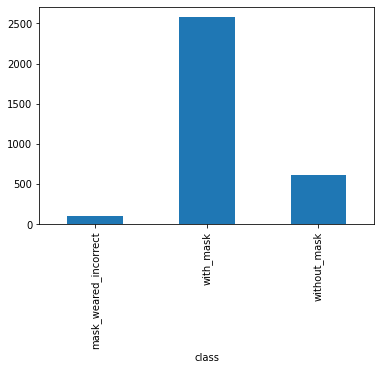

In [ ]:
train_csv.groupby('class').size().plot(kind='bar')

In [ ]:
source = train_csv['class'].value_counts()
fig = go.Figure(data=[go.Pie(labels=source.index,values=source.values)])
fig.update_layout(title='class distribution train')
# wandb.log({"class distribution train": fig})
fig.show()

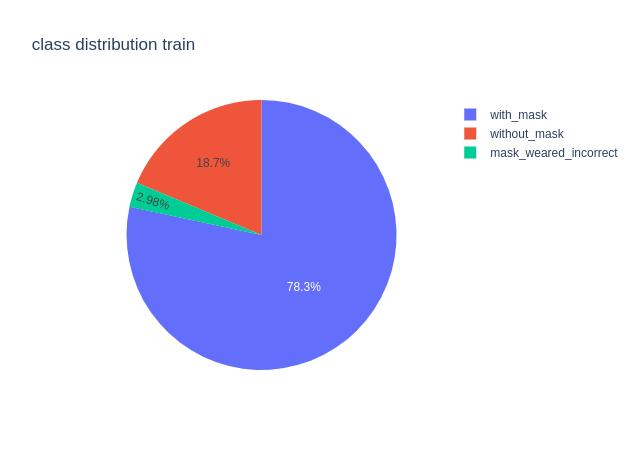

<AxesSubplot:xlabel='class'>

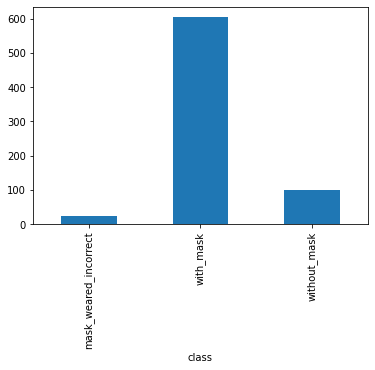

In [ ]:
valid_csv.groupby('class').size().plot(kind='bar')

In [ ]:
valid_csv.groupby('class').size()

class
mask_weared_incorrect     23
with_mask                605
without_mask             101
dtype: int64

In [ ]:
source = valid_csv['class'].value_counts()
fig = go.Figure(data=[go.Pie(labels=source.index,values=source.values)])
fig.update_layout(title='class distribution valid')
# wandb.log({"class distribution valid": fig})
fig.show()

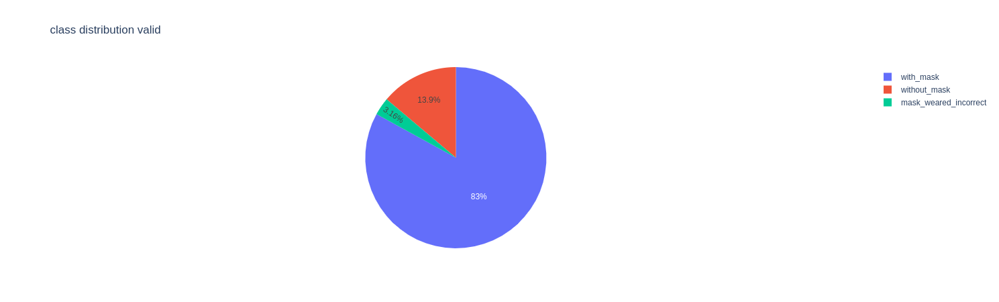

In [ ]:
class myOwnDataset(torch.utils.data.Dataset):
    def __init__(self, root, annotation, transforms=None):
        self.root = root
        self.transforms = transforms
        self.coco = COCO(annotation)
        self.ids = list(sorted(self.coco.imgs.keys()))

    def __getitem__(self, index):
        # Own coco file
        coco = self.coco
        # Image ID
        img_id = self.ids[index]
        # List: get annotation id from coco
        ann_ids = coco.getAnnIds(imgIds=img_id)
        # Dictionary:
        #  target coco_annotation file for an image
        coco_annotation = coco.loadAnns(ann_ids)
        # path for input image
        path = coco.loadImgs(img_id)[0]['file_name']
        # open the input image
        img = Image.open(os.path.join(self.root, path))

        # number of objects in the image
        num_objs = len(coco_annotation)

        # Bounding boxes for objects
        # In coco format, bbox = [xmin, ymin, width, height]
        # In pytorch, the input should be [xmin, ymin, xmax, ymax]
        boxes = []
        for i in range(num_objs):
            xmin = coco_annotation[i]['bbox'][0]
            ymin = coco_annotation[i]['bbox'][1]
            xmax = xmin + coco_annotation[i]['bbox'][2]
            ymax = ymin + coco_annotation[i]['bbox'][3]
            boxes.append([xmin, ymin, xmax, ymax])
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # Labels (In my case, I only one class: target class or background)
        # labels = torch.ones((num_objs,), dtype=torch.int64)
        # Tensorise img_id
        img_id = torch.tensor([img_id])
        # Size of bbox (Rectangular)
        areas = []
        for i in range(num_objs):
            areas.append(coco_annotation[i]['area'])
        areas = torch.as_tensor(areas, dtype=torch.float32)

        labels = []
        # print(coco_annotation[i]['area'])
        # print(coco_annotation[i]['category_id'])
        for i in range(num_objs):
            labels.append(int(coco_annotation[i]['category_id']))
        labels = torch.as_tensor(labels, dtype=torch.int64)
        # Iscrowd
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)

        # Annotation is in dictionary format
        my_annotation = {}
        my_annotation["boxes"] = boxes
        my_annotation["labels"] = labels
        my_annotation["image_id"] = img_id
        my_annotation["area"] = areas
        my_annotation["iscrowd"] = iscrowd

        # if self.transforms is not None:
        #     img = self.transforms(img)
        if self.transforms is not None:
            img, my_annotation  = self.transforms(img, my_annotation)

        return img, my_annotation

    def __len__(self):
        return len(self.ids)

In [ ]:
def get_transform(train):
    if train:
        return T.Compose([T.ToTensor()])
    else:
        return T.Compose([T.ToTensor()])
# , T.RandomVerticalFlip(0.2), T.RandomRotation(0.2)

In [ ]:
def get_transform_with_aug(train):
    if train:
        return Compose([ToTensor(), RandomHorizontalFlip(0.4)])
    else:
        return Compose([ToTensor()])

create data loaders

In [ ]:
# path to your own data and coco file
train_data_dir = "/home/linuxgpu/ex1/DATA/train"
train_coco = "/home/linuxgpu/ex1/DATA/train/_annotations.coco.json"
val_data_dir = "/home/linuxgpu/ex1/DATA//valid"
val_coco = "/home/linuxgpu/ex1/DATA//valid/_annotations.coco.json"


# create own Dataset
my_dataset_train = myOwnDataset(root=train_data_dir,
                          annotation=train_coco,
                          transforms=get_transform_with_aug(True)
                          )
my_dataset_val = myOwnDataset(root=val_data_dir,
                          annotation=val_coco,
                          transforms=get_transform_with_aug(False)
                          )
                          

# collate_fn needs for batch
def collate_fn(batch):
    return tuple(zip(*batch))

#DataLoaders
data_loader_train = torch.utils.data.DataLoader(my_dataset_train,
                                          batch_size=config['batch size'],
                                          shuffle=True,
                                          num_workers=config['num workers'],
                                          collate_fn=collate_fn)
data_loader_val = torch.utils.data.DataLoader(my_dataset_val,
                                          batch_size=config['batch size'],
                                          shuffle=False,
                                          num_workers=config['num workers'],
                                          collate_fn=collate_fn)
data_loaders = {"train":data_loader_train, "val":data_loader_val}

loading annotations into memory...
Done (t=0.02s)
creating index...
index created!
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!


now lets vizualise images with their annotations from the val set

In [ ]:
import logging
def plot_image_GT(all_imgs, all_annotations, size, trsh = 0):
   

    logger = logging.getLogger()
    old_level = logger.level
    logger.setLevel(100)
    i = 0
    if size > 20:
      size = 20
    fig,ax = plt.subplots(size, figsize=(15,300))

    for imgs, annotations in zip(all_imgs, all_annotations):

      for img_tensor, ann in zip (imgs, annotations):

        img = img_tensor.cpu().data
        
        img = img.permute(1, 2, 0)
        img = (img.numpy()).copy()
        img = img/np.amax(img)
        img_GT = img.copy()
        for GT_box, GT_label in zip(ann['boxes'].cpu().detach().numpy(),
                                                        ann['labels'].cpu().detach().numpy()):
            xmin, ymin, xmax, ymax = GT_box
            if GT_label == 1:
              color=	(255,255,0)
            elif GT_label == 2:
              color=(0,255,0)
            else:
              color=(255,0,0)

            img_GT = cv2.rectangle(img_GT, (int(xmin),int(ymin)),(int(xmax), int(ymax)), color = color, thickness = 1)
            
            # ax[i][j].add_patch(rect)
            # ax[i][j].text(xmin, ymin*0.9, str(scores) + "% " + label_dict[label],size =str((xmax-xmin)/1.5),color = "purple")
        ax[i].imshow(img_GT)
        ax[i].set_title("GT", fontdict = {'fontsize':35})
        i += 1
        if i >= size:
          break
      if i >= size:
          break
    plt.show()
    logger.setLevel(old_level)

In [ ]:
# select device (whether GPU or CPU)
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

create ground truth images to display from val set

In [ ]:

all_annotations = []
all_images = []

for imgs, annotations in data_loader_val:
    annotations = [{k: v.to(device) for k, v in t.items()} for t in annotations]
    imgs = list(img.to(device) for img in imgs)
    all_annotations.append(annotations)
    all_images.append(imgs)

display examples from the dataset

In [ ]:
plot_image_GT(all_images, all_annotations, len(all_images)*config['batch size'])

we can see from the data distribution that the incorrect, and no mask labels are under represented and the with mask label is over represented that can cause a problem in the model predictions.

In [ ]:
class AverageMeter(object):
    """Computes and stores the average and current value"""
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

we implemented a focal loss function into the pytorch detection source code, to try and handle with the data unbalanced distribution

In [ ]:
import torch.nn.functional as F
class FocalLoss(nn.Module): #implement youreself
    def __init__(self, alpha=0.25, gamma=2, logist=False, reduce='mean'):
        super(FocalLoss, self).__init__()
        self.alpha = alpha # the scalar factor between 0 and 1 
        self.gamma = gamma # focusing parameter(always positive) that reduces the relative loss for well-classified examples and puts more focus on hard misclassified examples
        self.cross_entropy_loss = F.cross_entropy
        #self.logist = logist # log probabilities 
        self.reduce = reduce # Specifies the reduction to apply to the output - none/mean/sum. ‘none’: no reduction will be applied, ‘mean’: the sum of the output will be divided by the number of elements in the output, ‘sum’: the output will be summed.

    def forward(self, inputs, targets):
        BCE_loss = self.cross_entropy_loss(inputs, targets)
        pt = torch.exp(-BCE_loss)
        F_loss = self.alpha * (1-pt)**self.gamma * BCE_loss

        if self.reduce:
            return torch.mean(F_loss)
        else:
            return F_loss

In [ ]:
fl = FocalLoss()
def fastrcnn_loss(class_logits, box_regression, labels, regression_targets):
    # type: (Tensor, Tensor, List[Tensor], List[Tensor]) -> Tuple[Tensor, Tensor]
    """
    Computes the loss for Faster R-CNN.
    Args:
        class_logits (Tensor)
        box_regression (Tensor)
        labels (list[BoxList])
        regression_targets (Tensor)
    Returns:
        classification_loss (Tensor)
        box_loss (Tensor)
    """

    labels = torch.cat(labels, dim=0)
    regression_targets = torch.cat(regression_targets, dim=0)

    classification_loss = fl(class_logits, labels)

    # get indices that correspond to the regression targets for
    # the corresponding ground truth labels, to be used with
    # advanced indexing
    sampled_pos_inds_subset = torch.where(labels > 0)[0]
    labels_pos = labels[sampled_pos_inds_subset]
    N, num_classes = class_logits.shape
    box_regression = box_regression.reshape(N, box_regression.size(-1) // 4, 4)

    box_loss = torch.nn.functional.smooth_l1_loss(
        box_regression[sampled_pos_inds_subset, labels_pos],
        regression_targets[sampled_pos_inds_subset],
        beta=1 / 9,
        reduction="sum",
    )
    box_loss = box_loss / labels.numel()

    return classification_loss, box_loss

In [ ]:
if config['loss'] == 'focal loss' :
    torchvision.models.detection.roi_heads.fastrcnn_loss = fastrcnn_loss

for this task we chose the faster rcnn architecture, because it is a fast and accurate object detection architecture, with  pretrained resnet50 backbone for high preformance rpm. 

In [ ]:
def get_model_instance(num_classes, load = False, path = None):
    # load an instance segmentation model pre-trained pre-trained on COCO
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
    # get number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    if load and path:
        model.load_state_dict(torch.load(path))
    # model.rpn.nms_thresh = 0.5
    # model.roi_heads.score_thresh = 0.5
    # model.roi_heads.nms_thresh = 0.05
    return model
    

we created a training loop, that also calculate several matrices for validation and log all of the information to wandb for better analysis.
every time the model reach to the his best map score there is a checkpoint save of the model state_dict.

In [ ]:
num_classes = config['num classes']
num_epochs = config['epochs']
model = get_model_instance(num_classes, config['load mode'], config['load path'])
model_name = '/home/linuxgpu/ex1/' + config['model name']
# move model to the right device
model.to(device)
    
# parameters
params = [p for p in model.parameters() if p.requires_grad]

if config['optimizer'] == 'adam':
    optimizer = torch.optim.Adam(params, lr=config["learning rate"])
elif config['optimizer'] == 'adamw':
    optimizer = torch.optim.AdamW(params, lr=config["learning rate"])
elif config['optimizer'] == 'SGD':
    optimizer = torch.optim.SGD(params, lr=config["learning rate"], momentum=0.9, weight_decay=0.0005)
    
wandb.watch(model, log="all", log_freq=3)
# scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=15, gamma=0.1)
best_map = 0
i = 0
for epoch in range(num_epochs):
    loss = AverageMeter()
    loss_classifier = AverageMeter()
    loss_box_reg = AverageMeter()
    loss_objectness = AverageMeter()
    loss_rpn_box = AverageMeter()
    m = MAP.MAP(class_metrics= True)
    for imgs, annotations in data_loader_train:
        i += 1
        model.train()
        imgs = list(img.to(device) for img in imgs)
        annotations = [{k: v.to(device) for k, v in t.items()} for t in annotations]
        
        loss_dict = model(imgs, annotations)
        
        losses = sum(loss for loss in loss_dict.values())
        loss.update(losses.item(), len(imgs))
        loss_classifier.update(loss_dict['loss_classifier'], len(imgs))
        loss_box_reg.update(loss_dict['loss_box_reg'], len(imgs))
        loss_objectness.update(loss_dict['loss_objectness'], len(imgs))
        loss_rpn_box.update(loss_dict['loss_rpn_box_reg'], len(imgs))

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()
        torch.cuda.empty_cache()
        
        model.eval()
        with torch.no_grad():
            outputs = model(imgs)
            m.update(outputs, annotations)
            torch.cuda.empty_cache()
        
    map_rsults_train = m.compute()
    map_train = map_rsults_train['map']
    print(f'train epoch : {epoch}/{num_epochs}, Loss: {loss.avg}, map: {map_train}')

    m = MAP.MAP(class_metrics= True)
    model.eval()
    for imgs, annotations in data_loader_val:
        annotations = [{k: v.to(device) for k, v in t.items()} for t in annotations]
        imgs = list(img.to(device) for img in imgs)
        with torch.no_grad():
            outputs = model(imgs)
            m.update(outputs, annotations)
            torch.cuda.empty_cache()
    map_rsults_val = m.compute()

    if map_rsults_val['map'] > best_map :
        best_map = map_rsults_val['map']
        torch.save(model.state_dict(), model_name)
    wandb.log({'loss':loss.avg, 'classifier loss':loss_classifier.avg, 'box loss':loss_box_reg.avg,
    'objectness loss':loss_objectness.avg, 'rpn box loss':loss_rpn_box.avg, 'map train':map_rsults_train['map'],
    'map mask_incorrect train':map_rsults_train['map_per_class'][0],
    'map with_mask train':map_rsults_train['map_per_class'][1],
    'map no_mask train':map_rsults_train['map_per_class'][2],
    'mar train':map_rsults_train['mar_1'],
    'mar mask_incorrect train':map_rsults_train['mar_100_per_class'][0],
    'mar with_mask train':map_rsults_train['mar_100_per_class'][1],
    'mar no_mask train':map_rsults_train['mar_100_per_class'][2],
    'map validation':map_rsults_val['map'],
    'map mask_incorrect validation':map_rsults_val['map_per_class'][0], 
    'map with_mask validation':map_rsults_val['map_per_class'][1],
    'map no_mask validation':map_rsults_val['map_per_class'][2],
    'mar validation':map_rsults_val['mar_1'],
    'mar mask_incorrect validation':map_rsults_val['mar_100_per_class'][0],
    'mar with_mask validation':map_rsults_val['mar_100_per_class'][1],
    'mar no_mask validation':map_rsults_val['mar_100_per_class'][2]}, step=epoch)
    # scheduler.step()
    # print(optimizer.state_dict()['param_groups'][0]['lr'])


train epoch : 0/20, Loss: 0.2769581710474681, map: tensor([0.1394])
train epoch : 1/20, Loss: 0.19890981360962257, map: tensor([0.1882])
train epoch : 2/20, Loss: 0.17820773524256933, map: tensor([0.2030])
train epoch : 3/20, Loss: 0.16421715726191316, map: tensor([0.2237])
train epoch : 4/20, Loss: 0.15611819086656809, map: tensor([0.2381])
train epoch : 5/20, Loss: 0.14492903882774982, map: tensor([0.2515])
train epoch : 6/20, Loss: 0.13566863028041382, map: tensor([0.2761])
train epoch : 7/20, Loss: 0.12831452833955617, map: tensor([0.2980])
train epoch : 8/20, Loss: 0.11741152838158221, map: tensor([0.3111])
train epoch : 9/20, Loss: 0.11552880794238464, map: tensor([0.3135])
train epoch : 10/20, Loss: 0.10891876514770288, map: tensor([0.3306])
train epoch : 11/20, Loss: 0.10632176259889715, map: tensor([0.3524])
train epoch : 12/20, Loss: 0.1074992475871843, map: tensor([0.3491])
train epoch : 13/20, Loss: 0.10082719516239863, map: tensor([0.3543])
train epoch : 14/20, Loss: 0.092

# hyperparameters analysis

now we going to explore and investigate several hyperparameters, lets start with SGD optimizer with learning rate of - 0.01, 0.001, 0.008. batch size of 4. were going to train for 20 epochs

**mean average recall**

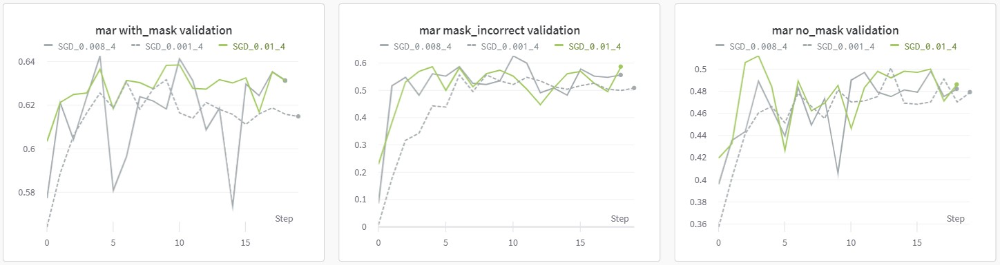

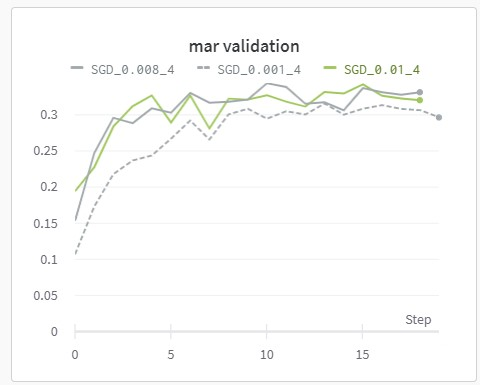

we can see from this analysis of mean average recall that the learning rate of 0.001 is the best for sgd optimizer

**mean average precision**

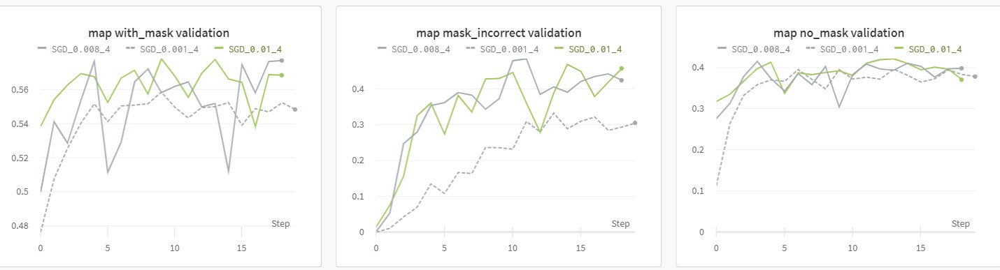

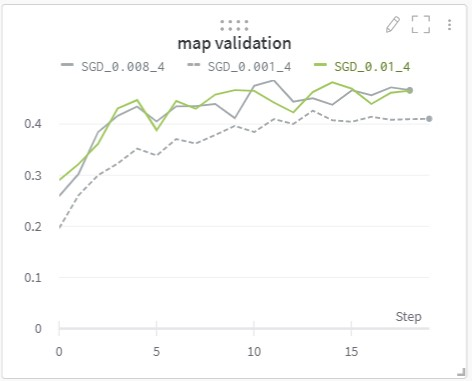

we can see from this analysis of mean average precision that the learning rate of 0.008 is the best for sgd optimizer

so after this first analysis of the sgd optimizer with the 3 learning rates, we decide that 0.008 is the best learning rate for sgd

now lets investigate learning rates for adam optimizer, we going to try 0.001, 0.0001

**mean average recall**

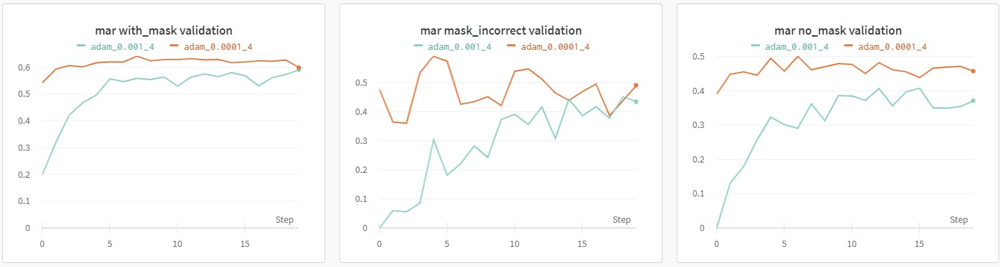

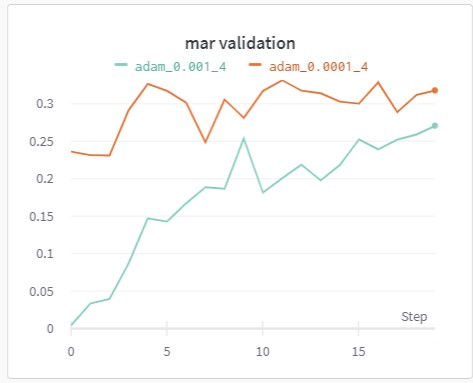

we can see from this analysis of mean average recall that the learning rate of 0.0001 is the best for adam optimizer

**mean average precision**

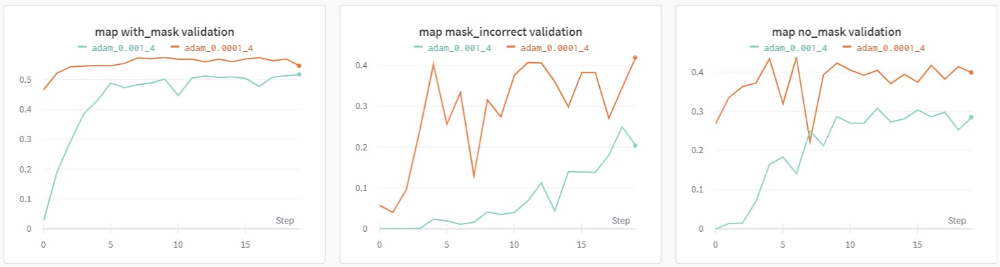

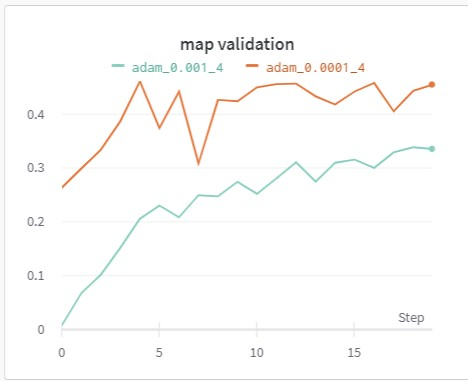

we can see from this analysis of mean average precision that the learning rate of 0.0001 is the best for adam optimizer

so after this first analysis of the adam optimizer with the 2 learning rates, we decide that 0.0001 is the best learning rate for adam

now lets investigate learning rates for adamw optimizer, we going to try 0.001, 0.0001, 0.00008

**mean average recall**

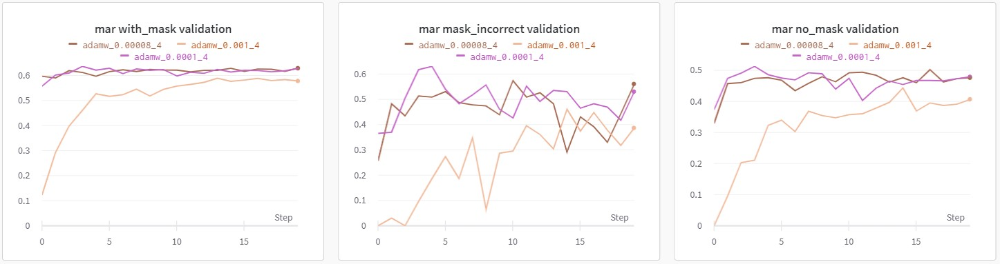

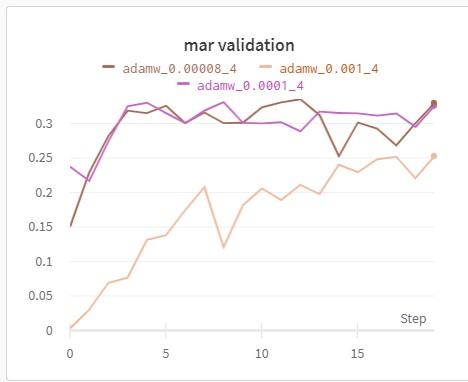

we can see from this analysis of mean average recall that the learning rate of 0.00008 is the best for adamw optimizer

**mean average precision**

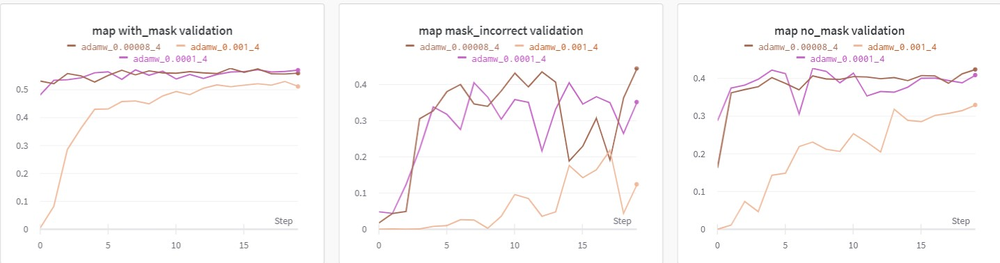

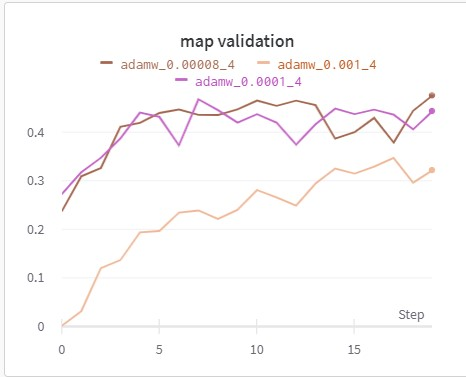

we can see from this analysis of mean average precision that the learning rate of 0.0001 is the best for adam optimizer, but it has quit similar performance to 0.00008 learning rate

so after this first analysis of the adamw optimizer with the 3 learning rates, we decide that 0.00008 is the best learning rate for adamw

after the first analysis of the learning rates for each optimizer, now we are going to compare the best learning rate of each optimizer - 
- sgd 0.008 lr
- adam 0.0001 lr
- adamw 0.00008 lr

**mean average recall**

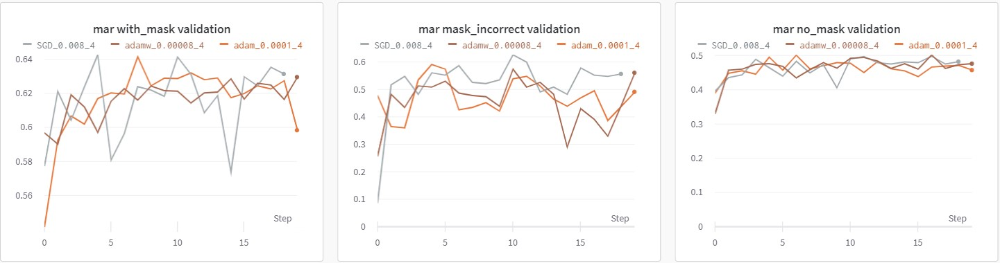

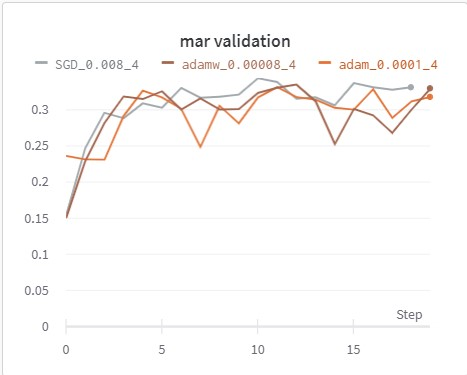

we can see from this analysis of mean average recall that the SGD with 0.008 lr is the best from the 3

**mean average precision**

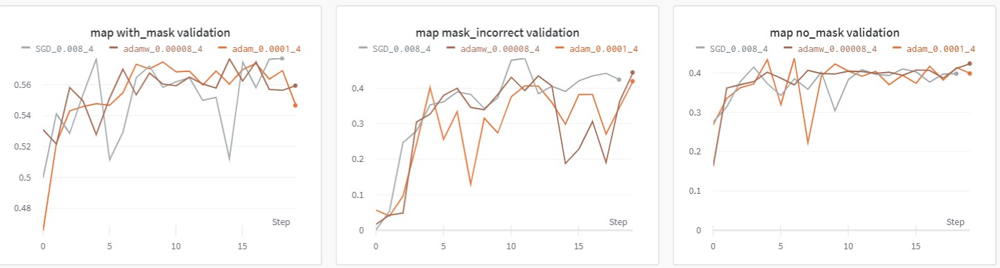

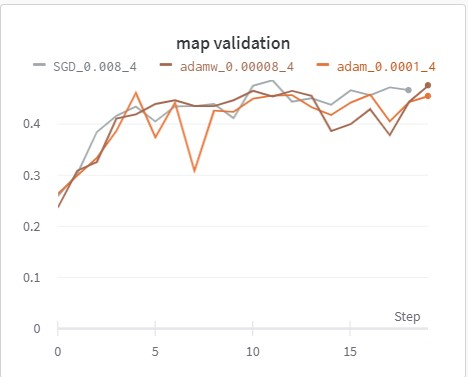

we can see from this analysis of mean average precison that the SGD with 0.008 lr is the best from the 3

so after this analysis of the 3 optimizers, we decide that SGD with 0.008 lr is the best.

now after we got our basic best optimizer with the best learning rate, lets try to improve it

lets try batch size of 8 and analysis the performance

**mean average recall**

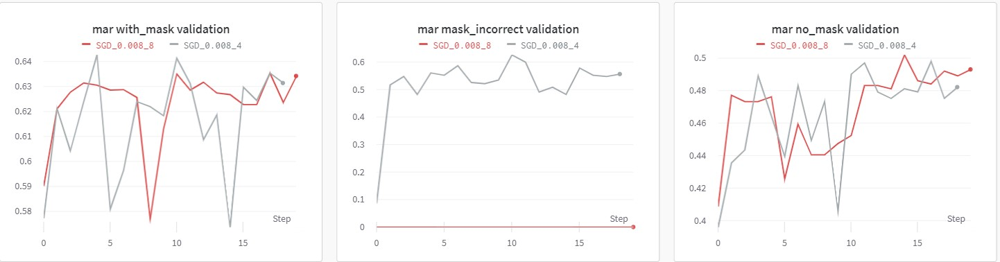

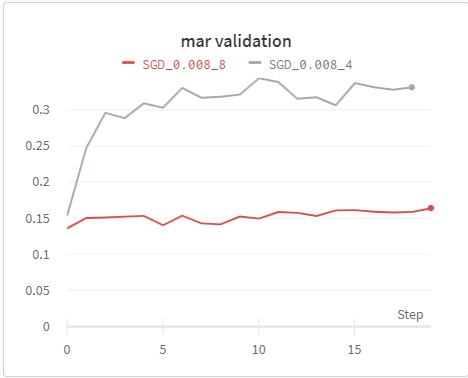

we can see from this analysis of mean average recall that the 4 batch size is better than the 8 batch size

**mean average precision**

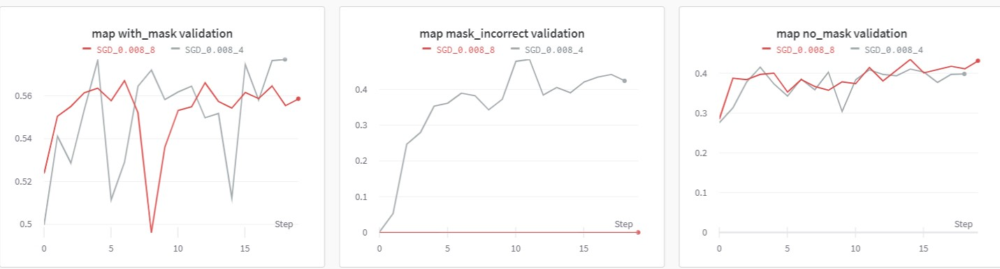

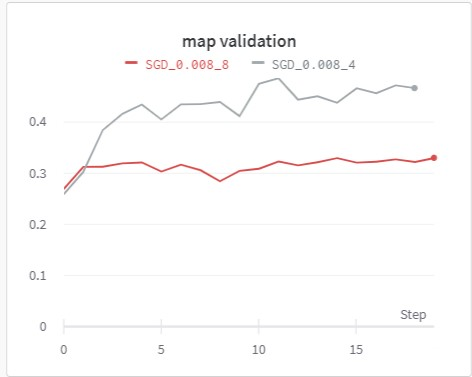

we can see from this analysis mean average precison that the 4 batch size is better than the 8 batch size

so after this analysis of the 2 batch sizes , we decide that 4 batch size is the best.

lets try to add random horizontal flip augmentation and analysis the performance

**mean average recall**

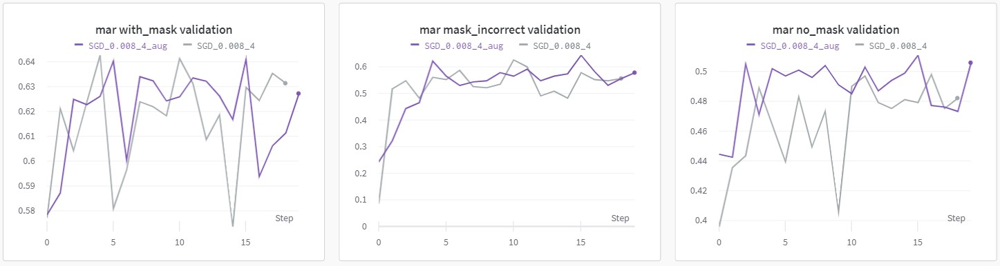

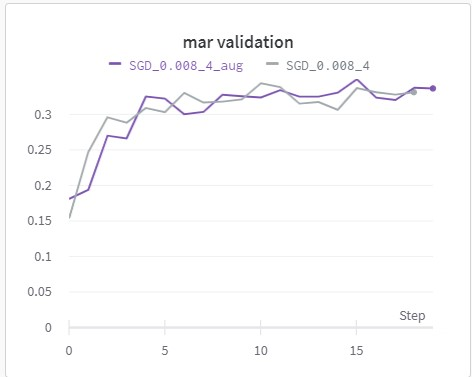

we can see from this analysis of mean average recall that random horizontal flip augmentation is improving performance

**mean average precision**

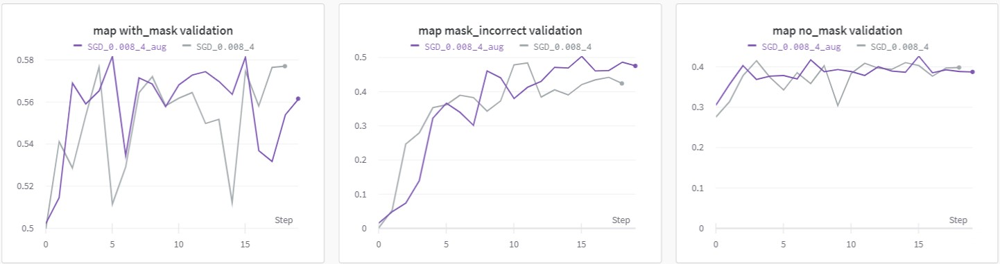

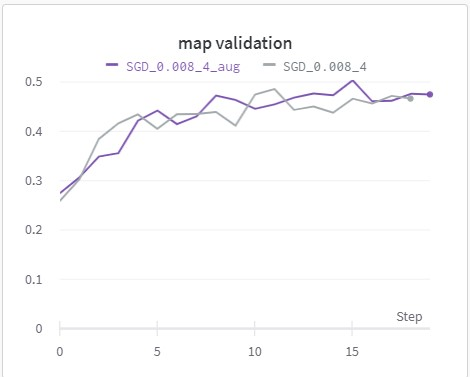

we can see from this analysis of mean average precison that random horizontal flip augmentation is improving performance

so after this analysis, we decide that random horizontal flip augmentation is improving performance.

now lets try to change the loss function to focal loss and see if there is improvment in performance

**mean average recall**

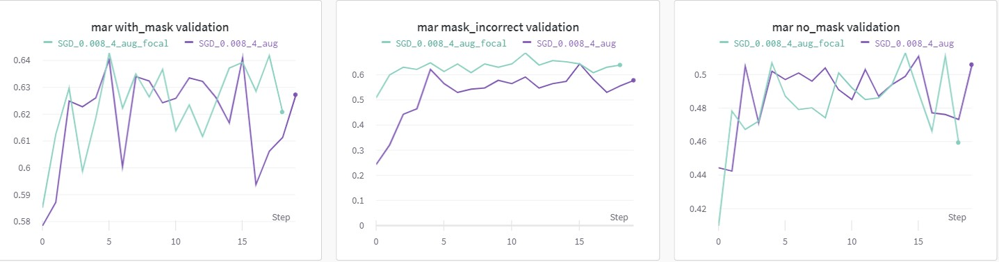

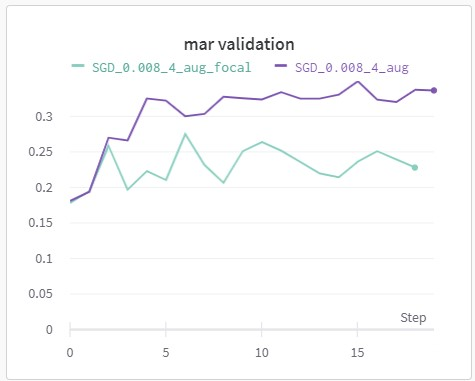

we can see from this analysis of mean average recall that focal loss doesnt improving performance, actualy its making it worse

**mean average precision**

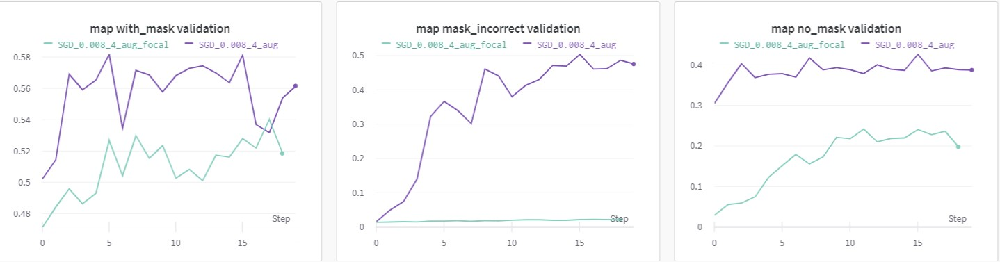

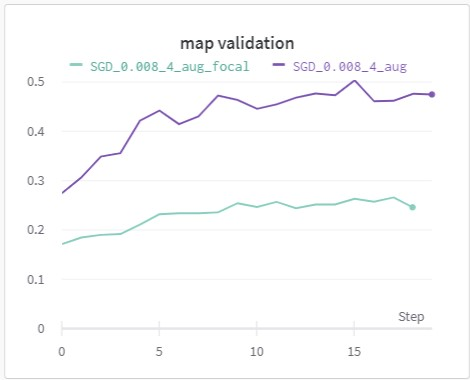

we can see from this analysis of mean average precison that focal loss doesnt improving performance, actualy its making it worse

so after this analysis, we decide that focal loss doesnt improving performance, actualy its making it worse.
thats suprising because we asumed that the focal loss will handle better with the unbalance data. 

**conclusion - the best hyperparameters found - SGD optimizer with 0.008 learning rate, batch size 4, and random horizontal flip augmentation. this model reached 0.5046 map validation score !**

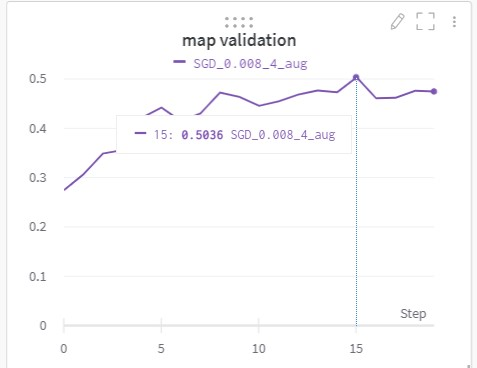

train losses of all the models

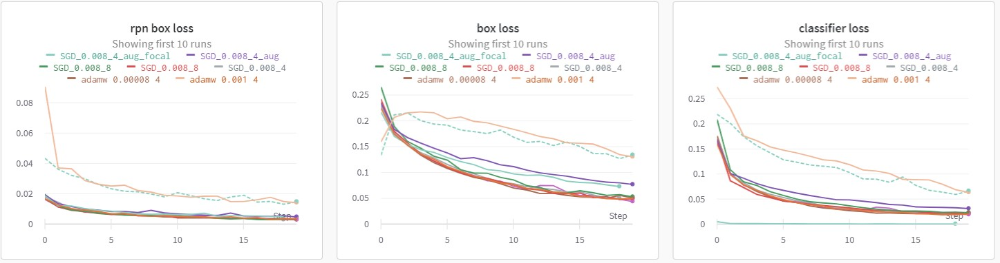

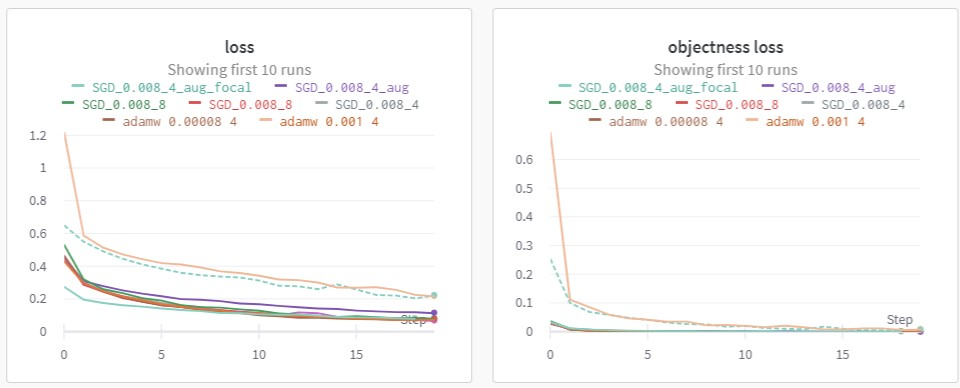

loading best model

In [ ]:
# for loading best model
model = get_model_instance(4, True, '/home/linuxgpu/Eldad/first/model_SGD_0.008_4_aug.pth')
model.to(device)

test the model and collect all of the inputs and outputs for analysis

In [ ]:
model.to(device)
model = model.eval()
m = MAP.MAP(class_metrics= True)
all_annotations = []
all_images = []
all_outputs = []

for imgs, annotations in data_loader_val:
    annotations = [{k: v.to(device) for k, v in t.items()} for t in annotations]
    imgs = list(img.to(device) for img in imgs)
    all_annotations.append(annotations)
    all_images.append(imgs)
    with torch.no_grad():
        outputs = model(imgs)

    all_outputs.append(outputs)
    m.update(outputs, annotations)
    torch.cuda.empty_cache()

/home/linuxgpu/anaconda3/envs/env1/lib/python3.9/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  /opt/conda/conda-bld/pytorch_1634272204863/work/aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


log all images with predicted annotations to wandb 

In [ ]:
class_id_to_label = {1:"inc_mask", 2:"mask", 3:"no_mask"}
i = 1
for outputs, imgs, annotations in zip(all_outputs, all_images, all_annotations) :
    for output, img, annotation in zip(outputs, imgs, annotations) :
        img_ = img.cpu().data.permute(1, 2, 0).numpy()
        # print(img_.shape)
        boxes={}
        boxes['predictions'] = {}
        boxes['predictions']['box_data'] = []
        boxes['predictions']['class_labels'] = class_id_to_label
        for box, label, score in zip(output['boxes'], output['labels'], output['scores']):
            d = dict()
            d['position'] = {}
            d['position']['minX'] = box[0].cpu().tolist()
            d['position']['maxX'] = box[1].cpu().tolist()
            d['position']['minY'] = box[2].cpu().tolist()
            d['position']['maxY'] = box[3].cpu().tolist()
            d['class_id'] = label.cpu().tolist()
            d['box_caption'] = class_id_to_label[label.cpu().tolist()]
            d['scores'] = {}
            d['scores']['score'] = score.cpu().tolist()
            d['domain'] = "pixel"
            boxes['predictions']['box_data'].append(d)
        # print(boxes)
        image = wandb.Image(img_, boxes=boxes)
        wandb.log({"image" + str(i): image})
        i += 1
        

example of a dict reffering to an image we log to wandb

In [ ]:
boxes

{'predictions': {'box_data': [{'position': {'minX': 310.9568176269531,
     'maxX': 30.83610725402832,
     'minY': 341.15509033203125,
     'maxY': 72.33366394042969},
    'class_id': 2,
    'box_caption': 'mask',
    'scores': {'score': 0.9995251893997192}}],
  'class_labels': {1: 'inc_mask', 2: 'mask', 3: 'no_mask'}}}

example of the model output for better understanding

In [ ]:
num = 0
outputs[num]

{'boxes': tensor([[121.2247,  78.6732, 163.6148, 141.7105],
         [259.3340, 150.3846, 299.7634, 210.3616],
         [382.2118,  42.9131, 413.5747,  99.6774],
         [194.8487, 161.3882, 233.6875, 220.3296]], device='cuda:0',
        grad_fn=<StackBackward0>),
 'labels': tensor([2, 2, 3, 3], device='cuda:0'),
 'scores': tensor([0.9986, 0.9985, 0.9983, 0.9982], device='cuda:0',
        grad_fn=<IndexBackward0>)}

In [ ]:
label_dict = {1:"inc_mask", 2:"mask", 3:"no_mask"}

a function we created for vizualising and comparing the predicted bounding box and the GT bounding box

In [ ]:
import logging
def plot_image(all_imgs, all_outputs, all_annotations, size, trsh = 0):
   

    logger = logging.getLogger()
    old_level = logger.level
    logger.setLevel(100)
    i = 0
    if size > 40:
      size = 40
    fig,ax = plt.subplots(size,2, figsize=(15,300))

    for imgs, outputs, annotations in zip(all_imgs, all_outputs, all_annotations):

      for img_tensor , output , ann in zip (imgs, outputs, annotations):

        img = img_tensor.cpu().data
        
        img = img.permute(1, 2, 0)
        img = (img.numpy()).copy()
        img = img/np.amax(img)
        img_predict = img.copy()
        img_GT = img.copy()
        for box, scores, label, GT_box, GT_label in zip(output["boxes"].cpu().detach().numpy(), output["scores"].cpu().detach().numpy(),
                                      output["labels"].cpu().detach().numpy(), ann['boxes'].cpu().detach().numpy(),
                                        ann['labels'].cpu().detach().numpy()):
            xmin, ymin, xmax, ymax = box
            if label == 1:
              color=	(255,255,0)
            elif label == 2:
              color=(0,255,0)
            else:
              color=(255,0,0)

            # rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=5,edgecolor=color,facecolor='none')

            img_predict = cv2.rectangle(img_predict, (int(xmin),int(ymin)),(int(xmax), int(ymax)), color = color, thickness = 1)
            
            # Add the patch to the Axes
            scores = int(scores*100)
            img_predict = cv2.putText(img_predict, str(scores) + "% ", (int(xmin), int(ymin*0.95)), cv2.FONT_HERSHEY_SIMPLEX, 
                    0.5, (255, 0, 0), 1, cv2.LINE_AA)

            xmin, ymin, xmax, ymax = GT_box
            if GT_label == 1:
              color=	(255,255,0)
            elif GT_label == 2:
              color=(0,255,0)
            else:
              color=(255,0,0)

            img_GT = cv2.rectangle(img_GT, (int(xmin),int(ymin)),(int(xmax), int(ymax)), color = color, thickness = 1)
            
            # ax[i][j].add_patch(rect)
            # ax[i][j].text(xmin, ymin*0.9, str(scores) + "% " + label_dict[label],size =str((xmax-xmin)/1.5),color = "purple")
        ax[i][0].imshow(img_predict)
        ax[i][0].set_title("predicted image", fontdict = {'fontsize':50})
        ax[i][1].imshow(img_GT)
        ax[i][1].set_title("GT", fontdict = {'fontsize':35})
        i += 1
        if i >= size:
          break
        
      if i >= size:
          break
    plt.show()
    logger.setLevel(old_level)

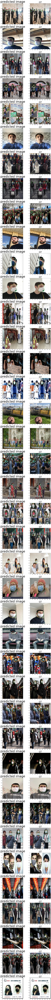

In [ ]:
plot_image(all_images, all_outputs, all_annotations, len(all_images)*config['batch size'])

In [ ]:
torch.cuda.is_available()

True